In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

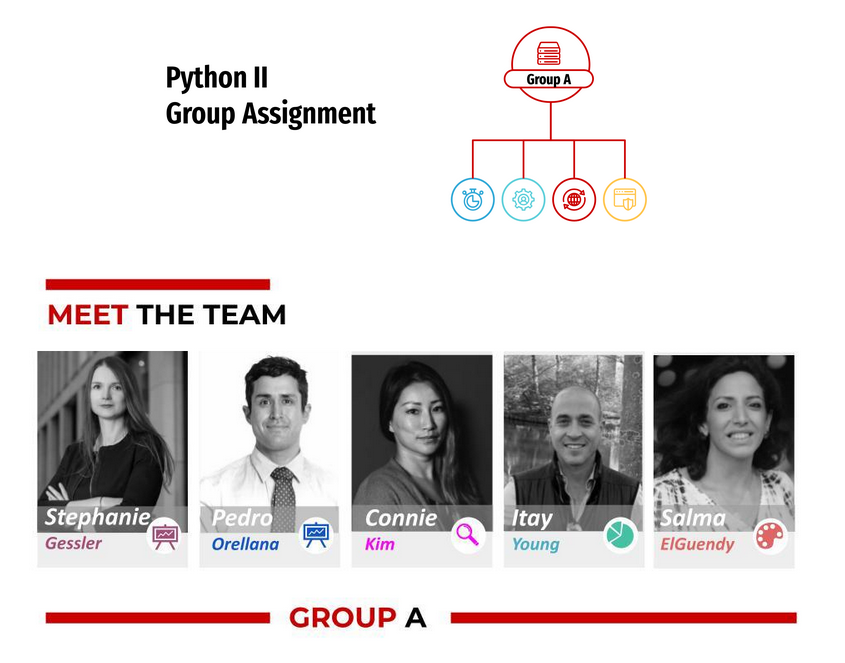

# <font color=DarkRed>__Python Assignment Group A - Fairdetect Test - Part II__</font>

# Sections 
* [Libaries used](#0)
* [1. Fairdetect Description](#1)
* [2. Loading synthetic credit card approval dataset](#2)
* [3. Exploratory Data Analysis](#3)  
  * [3.1 Profile Pandas](#3.1)
  * [3.2 Own EDA](#3.2)
* [4. Data Cleansing](#4) 
* [5. Data Splitting](#5)
* [6. Model Training](#6)
* [7. Testing Bias with FairDetect](#7)
* [8. SHapley Additive exPlanations (SHAP)](#8)

<a id='0'></a>
# Libaries and pip installments used

# ***Installing dependencies***  

### Skip if you already installed pandas-profiling tool

In [2]:
#Installs Pandas Profiling Tool from an alternative repository
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip      
!pip install pyyaml==5.4.1 

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'


# Importing Ryan's functions now converted as classes

In [3]:
#Original code is fairdetect_functions
import fairdetect_classes 
from fairdetect_classes import FairDetect, Report, Backup, EnhancedLabelEncoder, Splitting
#Everything is imported from the fairdetect_classes import list so next lines are skippable

## In case you need any of the libraries in the fairdetect_functions.py

<a id='1'></a>
# 1. Fairdetect Description

# Transparent Unfairness - How to Use the  Methods from fairdetect_classes.py

## An approach to detecting and understanding machine learning bias, by Ryan Daher

### Improvements made by Group A - MBD Part Time 2022-23

Congregating the various theoretical concepts into a practical framework, we can follow the “theoretical lens of a ‘sense-plan-act’ cycle”, as described by the HLEG framework (European Commission and Directorate-General for Communications Networks, Content and Technology, 2019). Applying this concept to the problem of ML fairness, we can break down three core steps in providing robust, and responsible artificial intelligence: Identify, Understand, and Act (IUA).

1. __Identify__: The process of exposing direct or indirect biases within a dataset and/or model.
1. __Understand__: The process of isolating impactful scenarios and obtaining trans parent explanations for outcomes.
1. __Act__: The process of reporting and rectifying identified disparities within the

By understanding the philosophical forms of unfairness as defined by our review of the literature and categorizing our prominent fairness metrics into the overarching categories of representation, ability, and performance, we can establish a series of tests to “identify” levels of disparities between sensitive groups at different levels. Merging these findings with the explainability of our models through the use of white-box models, or Shapley value estimation for black-box models, we can dig deeper into the model’s predictions, “understanding” how classifications were made, and how they varied from the natural dataset exposing both natural biases as well as added model differences. Finally, by probing further into levels of misclassification, in particular looking at negative outcomes, we can isolate groups most at risk and set up a series of “actions” that can be taken to mitigate the effects. Given this three-step framework which combines societal, legal, and technical considerations, the paper will then go through a series of cases, and examine the proposed framework.



# Let's use fairdetect_classes to find biases
For using fairdetect_classes we need create a model, for this we will:
1. Import methods from classes files__ from fairdetect_classes (done at the beginning)
1. then __load a dataset__, in this case we will use: synthetic credit card approval (already loaded with synthetic credit)
1. then __clean and prepare the dataset__ for modeling, there are some duplicates in this case, we will take care of them below
1. then we __split the data in train and test sets__ 
1. then we __build a model__, in this case we applying a Machine Learning (ML) model called XGBoost Classifier. The reason for choosing a ML is that ML models are harded to visualize, sometimes called Black Box models, what makes very difficult to see if any bias is present in the model.



<a id='2'></a>
# 2. Loading Car Insurance Claim dataset

This is imbalanced dataset to test the classes.

Here 0 - Claim was not made, 1 - Claim made. 

In [4]:
import pandas as pd

# Read csv into a pandas DataFrame

data = pd.read_csv("Car_Insurance_Claim.csv")
data

,ID,AGE,GENDER,RACE,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,VEHICLE_TYPE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
0,569520,65+,female,majority,0-9y,high school,upper class,0.629027,1.0,after 2015,0.0,1.0,10238,12000.0,sedan,0,0,0,0.0
1,750365,16-25,male,majority,0-9y,none,poverty,0.357757,0.0,before 2015,0.0,0.0,10238,16000.0,sedan,0,0,0,1.0
2,199901,16-25,female,majority,0-9y,high school,working class,0.493146,1.0,before 2015,0.0,0.0,10238,11000.0,sedan,0,0,0,0.0
3,478866,16-25,male,majority,0-9y,university,working class,0.206013,1.0,before 2015,0.0,1.0,32765,11000.0,sedan,0,0,0,0.0
4,731664,26-39,male,majority,10-19y,none,working class,0.388366,1.0,before 2015,0.0,0.0,32765,12000.0,sedan,2,0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,323164,26-39,female,majority,10-19y,university,upper class,0.582787,1.0,before 2015,0.0,0.0,10238,16000.0,sedan,0,0,1,0.0
9996,910346,26-39,female,majority,10-19y,none,middle class,0.522231,1.0,after 2015,0.0,1.0,32765,NaN,sedan,1,0,0,0.0
9997,468409,26-39,male,majority,0-9y,high school,middle class,0.470940,1.0,before 2015,0.0,1.0,10238,14000.0,sedan,0,0,0,0.0
9998,903459,26-39,female,majority,10-19y,high school,poverty,0.364185,0.0,before 2015,0.0,1.0,10238,13000.0,sedan,2,0,1,1.0


## Taking a look at how the data looks like (Head, describe and value counts...)

In [5]:
data.describe()

,ID,CREDIT_SCORE,VEHICLE_OWNERSHIP,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
count,10000.000000,9018.000000,10000.000000,10000.000000,10000.000000,10000.000000,9043.000000,10000.000000,10000.00000,10000.000000,10000.000000
mean,500521.906800,0.515813,0.697000,0.498200,0.688800,19864.548400,11697.003207,1.482900,0.23920,1.056300,0.313300
std,290030.768758,0.137688,0.459578,0.500022,0.463008,18915.613855,2818.434528,2.241966,0.55499,1.652454,0.463858
min,101.000000,0.053358,0.000000,0.000000,0.000000,10238.000000,2000.000000,0.000000,0.00000,0.000000,0.000000
25%,249638.500000,0.417191,0.000000,0.000000,0.000000,10238.000000,10000.000000,0.000000,0.00000,0.000000,0.000000
50%,501777.000000,0.525033,1.000000,0.000000,1.000000,10238.000000,12000.000000,0.000000,0.00000,0.000000,0.000000
75%,753974.500000,0.618312,1.000000,1.000000,1.000000,32765.000000,14000.000000,2.000000,0.00000,2.000000,1.000000
max,999976.000000,0.960819,1.000000,1.000000,1.000000,92101.000000,22000.000000,22.000000,6.00000,15.000000,1.000000


In [6]:
data.dtypes


ID                       int64
AGE                     object
GENDER                  object
RACE                    object
DRIVING_EXPERIENCE      object
EDUCATION               object
INCOME                  object
CREDIT_SCORE           float64
VEHICLE_OWNERSHIP      float64
VEHICLE_YEAR            object
MARRIED                float64
CHILDREN               float64
POSTAL_CODE              int64
ANNUAL_MILEAGE         float64
VEHICLE_TYPE            object
SPEEDING_VIOLATIONS      int64
DUIS                     int64
PAST_ACCIDENTS           int64
OUTCOME                float64
dtype: object

In [7]:
data.head()

,ID,AGE,GENDER,RACE,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,VEHICLE_TYPE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
0,569520,65+,female,majority,0-9y,high school,upper class,0.629027,1.0,after 2015,0.0,1.0,10238,12000.0,sedan,0,0,0,0.0
1,750365,16-25,male,majority,0-9y,none,poverty,0.357757,0.0,before 2015,0.0,0.0,10238,16000.0,sedan,0,0,0,1.0
2,199901,16-25,female,majority,0-9y,high school,working class,0.493146,1.0,before 2015,0.0,0.0,10238,11000.0,sedan,0,0,0,0.0
3,478866,16-25,male,majority,0-9y,university,working class,0.206013,1.0,before 2015,0.0,1.0,32765,11000.0,sedan,0,0,0,0.0
4,731664,26-39,male,majority,10-19y,none,working class,0.388366,1.0,before 2015,0.0,0.0,32765,12000.0,sedan,2,0,1,1.0


In [8]:
data.value_counts('OUTCOME')

OUTCOME
0.0    6867
1.0    3133
dtype: int64

3/4 own a vehicle

In [9]:
data.value_counts('PAST_ACCIDENTS')

PAST_ACCIDENTS
0     5584
1     1783
2     1104
3      646
4      366
5      232
6      144
7       61
8       41
9       19
10       9
11       7
12       2
14       1
15       1
dtype: int64

3/5 do not own a house

<a id='3'></a>

# 3. Exploratory Data Analysis 
### Analysis of the dataset 

<a id='3.1'></a>
## 3.1 Pandas Profiling 
### Do not run if pandas-profiling tool is not installed

In [10]:
from pandas_profiling import ProfileReport
report = ProfileReport(data, minimal=False)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Remarks from the EDA

### Highlights
- 19 attributes, 6 numeric and 13 categroial 

- 10k records, missing values but 0 duplicates

- Credid Score is a little bit skwewed to the left 

- Speeding vialation is skewed to the right

- Outcome 0 is double as to 1 


<a id='3.2'></a>
## 3.2. Own EDA  

### Highlights

- Quick and easy analysis on the numerical variables in a histogram , Annual Mileage seems to be normal distributed 

- Pairplot shows the relationship of variables among each other 

- ViolinPlot is a hybrid of a box plot and a kernel density plot, it shows the distribion of categroial data in terms of the dependent variable 

- Correlation matrix can give a quick correlation of the variables,in the dataset you can see there are not many variables highly correlated(threshold >0.5) 

## Alternative to Pandas-profiling tool to understand better the initial biases (user experience enhancement)

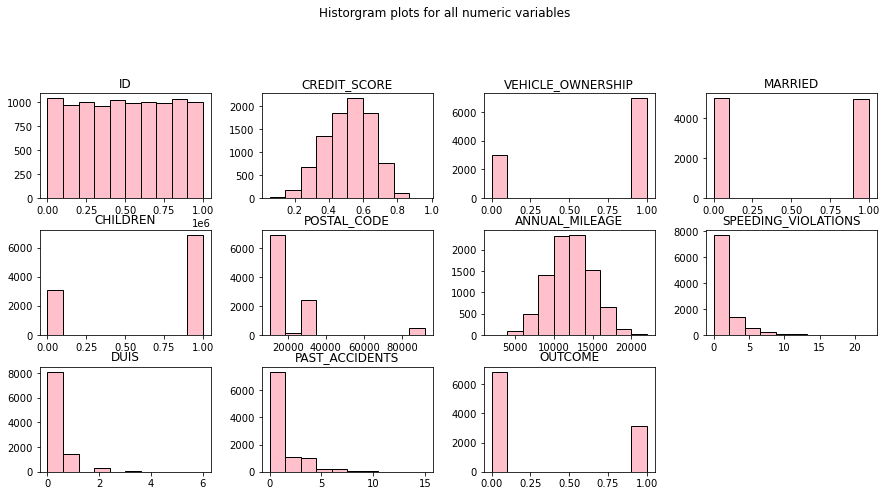

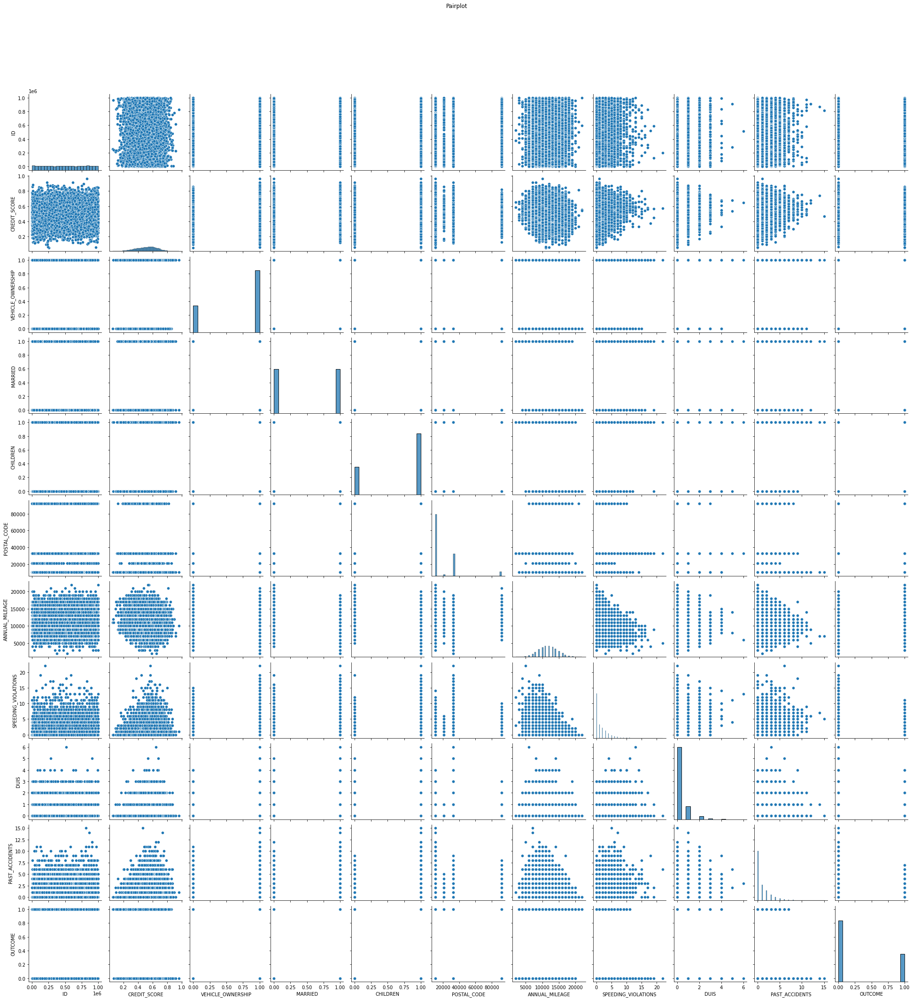

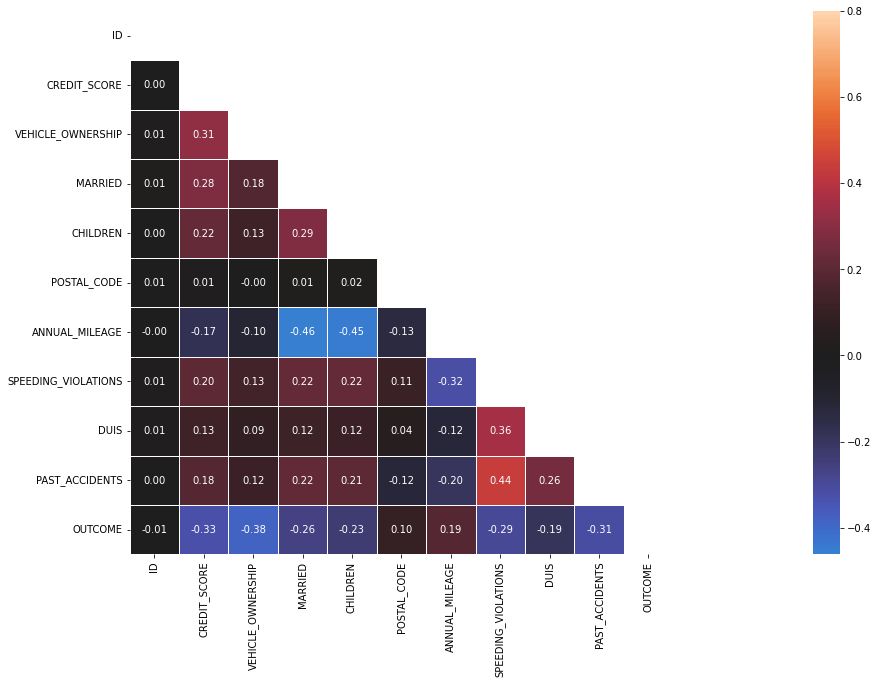

<Figure size 432x288 with 0 Axes>

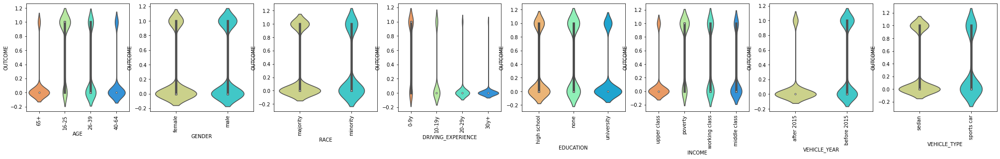

(array([[<AxesSubplot:title={'center':'ID'}>,
         <AxesSubplot:title={'center':'CREDIT_SCORE'}>,
         <AxesSubplot:title={'center':'VEHICLE_OWNERSHIP'}>,
         <AxesSubplot:title={'center':'MARRIED'}>],
        [<AxesSubplot:title={'center':'CHILDREN'}>,
         <AxesSubplot:title={'center':'POSTAL_CODE'}>,
         <AxesSubplot:title={'center':'ANNUAL_MILEAGE'}>,
         <AxesSubplot:title={'center':'SPEEDING_VIOLATIONS'}>],
        [<AxesSubplot:title={'center':'DUIS'}>,
         <AxesSubplot:title={'center':'PAST_ACCIDENTS'}>,
         <AxesSubplot:title={'center':'OUTCOME'}>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]],
       dtype=object),
 Text(0.5, 1.08, 'Pairplot'),
 <AxesSubplot:>,
 )

In [11]:
r = Report()
r.profilereporting(data,'OUTCOME')
# Must wait at least one minute

### Similar conclusions as with pandas-profiling
- As an example on the Violinplot, poverty could be an indication of more accidents 

<a id='4'></a>
# 4. Data Cleaning
## Transforming/coding text into numbers

## Will only work with categorical variables. In this case, since we only have integers, it won't work!

In [12]:
from fairdetect_classes import EnhancedLabelEncoder
le = EnhancedLabelEncoder()
le.fit_transform_columns(data)

,ID,AGE,GENDER,RACE,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,VEHICLE_TYPE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
0,569520,3,0,0,0,0,2,0.629027,1.0,0,0.0,1.0,10238,12000.0,0,0,0,0,0.0
1,750365,0,1,0,0,1,1,0.357757,0.0,1,0.0,0.0,10238,16000.0,0,0,0,0,1.0
2,199901,0,0,0,0,0,3,0.493146,1.0,1,0.0,0.0,10238,11000.0,0,0,0,0,0.0
3,478866,0,1,0,0,2,3,0.206013,1.0,1,0.0,1.0,32765,11000.0,0,0,0,0,0.0
4,731664,1,1,0,1,1,3,0.388366,1.0,1,0.0,0.0,32765,12000.0,0,2,0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,323164,1,0,0,1,2,2,0.582787,1.0,1,0.0,0.0,10238,16000.0,0,0,0,1,0.0
9996,910346,1,0,0,1,1,0,0.522231,1.0,0,0.0,1.0,32765,NaN,0,1,0,0,0.0
9997,468409,1,1,0,0,0,0,0.470940,1.0,1,0.0,1.0,10238,14000.0,0,0,0,0,0.0
9998,903459,1,0,0,1,0,1,0.364185,0.0,1,0.0,1.0,10238,13000.0,0,2,0,1,1.0


In [13]:
# delete the column 'Locations'
del data['ID']
data

,AGE,GENDER,RACE,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,VEHICLE_TYPE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
0,3,0,0,0,0,2,0.629027,1.0,0,0.0,1.0,10238,12000.0,0,0,0,0,0.0
1,0,1,0,0,1,1,0.357757,0.0,1,0.0,0.0,10238,16000.0,0,0,0,0,1.0
2,0,0,0,0,0,3,0.493146,1.0,1,0.0,0.0,10238,11000.0,0,0,0,0,0.0
3,0,1,0,0,2,3,0.206013,1.0,1,0.0,1.0,32765,11000.0,0,0,0,0,0.0
4,1,1,0,1,1,3,0.388366,1.0,1,0.0,0.0,32765,12000.0,0,2,0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,0,0,1,2,2,0.582787,1.0,1,0.0,0.0,10238,16000.0,0,0,0,1,0.0
9996,1,0,0,1,1,0,0.522231,1.0,0,0.0,1.0,32765,NaN,0,1,0,0,0.0
9997,1,1,0,0,0,0,0.470940,1.0,1,0.0,1.0,10238,14000.0,0,0,0,0,0.0
9998,1,0,0,1,0,1,0.364185,0.0,1,0.0,1.0,10238,13000.0,0,2,0,1,1.0


In [14]:
# delete the column 'Locations'
del data['POSTAL_CODE']
data

,AGE,GENDER,RACE,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,ANNUAL_MILEAGE,VEHICLE_TYPE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
0,3,0,0,0,0,2,0.629027,1.0,0,0.0,1.0,12000.0,0,0,0,0,0.0
1,0,1,0,0,1,1,0.357757,0.0,1,0.0,0.0,16000.0,0,0,0,0,1.0
2,0,0,0,0,0,3,0.493146,1.0,1,0.0,0.0,11000.0,0,0,0,0,0.0
3,0,1,0,0,2,3,0.206013,1.0,1,0.0,1.0,11000.0,0,0,0,0,0.0
4,1,1,0,1,1,3,0.388366,1.0,1,0.0,0.0,12000.0,0,2,0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,0,0,1,2,2,0.582787,1.0,1,0.0,0.0,16000.0,0,0,0,1,0.0
9996,1,0,0,1,1,0,0.522231,1.0,0,0.0,1.0,NaN,0,1,0,0,0.0
9997,1,1,0,0,0,0,0.470940,1.0,1,0.0,1.0,14000.0,0,0,0,0,0.0
9998,1,0,0,1,0,1,0.364185,0.0,1,0.0,1.0,13000.0,0,2,0,1,1.0


## Dropping duplicates

In [15]:
data.drop_duplicates()

,AGE,GENDER,RACE,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,ANNUAL_MILEAGE,VEHICLE_TYPE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
0,3,0,0,0,0,2,0.629027,1.0,0,0.0,1.0,12000.0,0,0,0,0,0.0
1,0,1,0,0,1,1,0.357757,0.0,1,0.0,0.0,16000.0,0,0,0,0,1.0
2,0,0,0,0,0,3,0.493146,1.0,1,0.0,0.0,11000.0,0,0,0,0,0.0
3,0,1,0,0,2,3,0.206013,1.0,1,0.0,1.0,11000.0,0,0,0,0,0.0
4,1,1,0,1,1,3,0.388366,1.0,1,0.0,0.0,12000.0,0,2,0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,0,0,1,2,2,0.582787,1.0,1,0.0,0.0,16000.0,0,0,0,1,0.0
9996,1,0,0,1,1,0,0.522231,1.0,0,0.0,1.0,NaN,0,1,0,0,0.0
9997,1,1,0,0,0,0,0.470940,1.0,1,0.0,1.0,14000.0,0,0,0,0,0.0
9998,1,0,0,1,0,1,0.364185,0.0,1,0.0,1.0,13000.0,0,2,0,1,1.0


<a id='5'></a>
# 5. Data splitting to feed into the XGBOOST

## Splitting the data into train and test

In [16]:
from fairdetect_classes import Splitting
sp = Splitting()
X_train, X_test, y_train, y_test = sp.split_data(data,'OUTCOME') #define the dependent parameter 

In [17]:
X_train.shape

(8000, 16)

In [18]:
X_test.shape

(2000, 16)

<a id='6'></a>
## 6. Training with the XGBoost model

In [19]:
#Skip if already installed
!pip install xgboost   

In [20]:
import xgboost
model = xgboost.XGBClassifier().fit(X_train, y_train)
y_test_predict = model.predict(X_test)
y_test_predict

array([1, 0, 0, ..., 1, 0, 0])

In [21]:
fd = FairDetect(model, X_test, y_test)

<a id='7'></a>
## 7. Testing Bias with FairDetect 
### Representation works now with classes implementation

Confusion Matrix


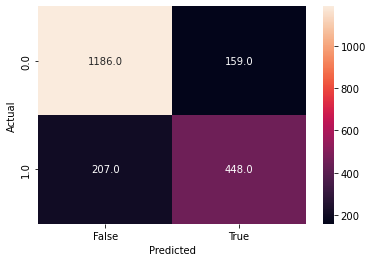

C:\Users\Stephanie\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



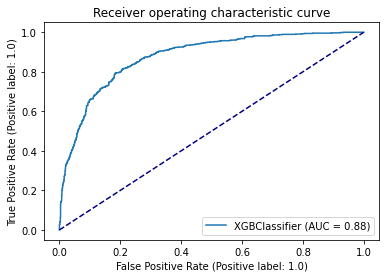

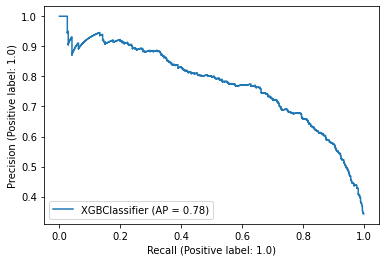

              precision    recall  f1-score   support

         0.0       0.85      0.88      0.87      1345
         1.0       0.74      0.68      0.71       655

    accuracy                           0.82      2000
   macro avg       0.79      0.78      0.79      2000
weighted avg       0.81      0.82      0.82      2000

AUC 0.7828769261329777
REPRESENTATION


╒════╤══════════╤══════════╕
│    │   Female │     Male │
╞════╪══════════╪══════════╡
│  0 │ 0.719352 │ 0.626851 │
├────┼──────────┼──────────┤
│  1 │ 0.280648 │ 0.373149 │
╘════╧══════════╧══════════╛ 

*** Reject H0: Significant Relation Between GENDER and Target with p= 1.3046093885273882e-05


ABILITY


Accept H0: True Positive Disparity Not Detected. p= 0.13804319055651115
Accept H0: False Positive Disparity Not Detected. p= 0.4659529502656584
Accept H0: True Negative Disparity Not Detected. p= 0.7885299021401462
** Reject H0: Significant False Negative Disparity with p= 0.03428127619848132


PREDICTIVE


Accept H0: No Significant Predictive Disparity. p= 0.5376724537307724


In [22]:
sensitive = 'GENDER' # sensible variable one wants to test for biases
labels = {0:'Female',1:'Male'} # 0 - GROUP A and 1 - GROUP B Because we dont know yet what Group is referring to
fd.identify_bias(sensitive,labels)


With the car isurance claim, we are provided several features to determine whether a candidate claimed a car isurance 

Among this datase, we are choosing as a sensitive group, the Gender Group. We do not know however if it makes reference also could be used for any other attribute. We know however, it is a binary attribute

To generate predictions, we will use an XGBoost classifier which received an overall test accuracy of (X%) indicating moderate predictive performance

__Classification__<br>
With the classification matrix you can see that the majority of our prediction is correctly classified. You can also see that the model has a high AUC curve with 0.81. 

<font color=blue>__Representation__</font><br>

We will begin by observing representation factors by  looking at the representation of both the Gender labels and outcome labels (Target for a insurance claim). 

In this case and having female and male, it can be seen they are similar in size. 

It can also be seen that most of the people are not a target for a care insurance claim, with Female having less chances of being targetted.

While the model will not train based on an unbalanced population sample due to it being symetrical, it seems to be the case Male is the main target in car insurance claim, for which other factors have to be considered so to determine if there is a bias or not

REPRESENTATION


<table>
    
   <tr>
       <td></td>
       <td>Female</td>
       <td>Male</td>
    </tr>
   <tr>
       <td>0</td>
       <td>0.719</td>
       <td>0.626</td>
    </tr>
   <tr>
       <td>1</td>
       <td>0.280</td>
       <td>0.373</td>
    </tr>    
</table>

Testing for demographic parity, we look at the normalized contingency table between our female and male and the target, running our chisquared assessment we obtain a p of below 0.0, rejecting our null hypothesis of independence and indicating there is a significant relation between Gender and the TARGET. 



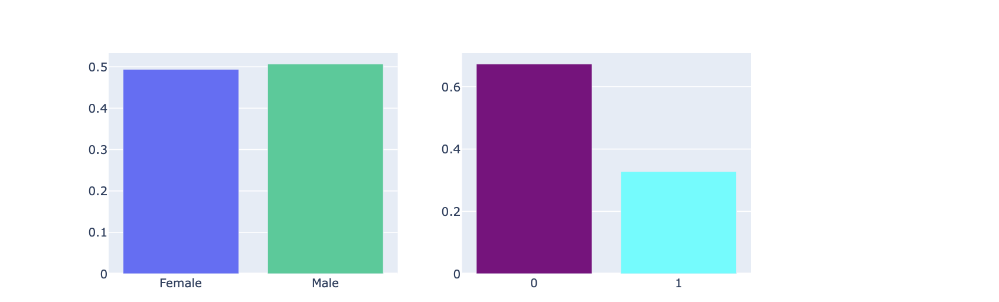

Moving then into the principle of ability, we compute our true-positive and false-positive rates for both groups

* True Positive Rate for Female 69%
* True Positive Rate for Male 79%


Based on our true positive rates, it seems as though we have a small difference between sensitive groups, however, running our chi-squared test, we obtain a p of .39, accepting our null, and indicating no significant difference between our true positive rates. This would thus satisfy equal opportunity for both Gender indicating both could be theoretically targetted in the same way.

* False Positive Rate for Female 10%
* False Positive Rate for Male 13%

In addition, the false-positive rates for both groups seem rather consistent with a p of .46, allowing us to accept our null hypothesis of no significant differences between the false-positive rates and noting similar levels of high-risk misclassifications for either group.

* True Negative Rate for Female 89%
* True Negative Rate for Male 86%

Looking at true negative rates in which our model correctly predicted proper low risk classifications we see similar scores for both groups supported by a p of .78, indicating similar levels of proper low-risk classifications for group.

* False Negative Rate for Female: 30%
* False Negative Rate for Male: 20%

Finally looking at false-negative rates we get a similar picture, it seems as though Femal are being incorrectly labeled as being of low TARGET at a much higher rate than Male, supporting this is a p of .14, while the pvalue is still enough to accept the null hypothesis, it comes to show the possible bias towards Female

* Precision for Female: 92%
* Precision for Male: 97%


Finally, to observe model exacerbation of biases through the lens of predictive parity, we notice a slight difference of 5 points in the precision scores for both groups. Looking at the chisquared test, however, we obtain a p of .69 signaling low significance of disparity, we are informed that the model is not greatly hindering either group, but rather enforcing  existing disparities. 

This is complimentary of our previous analysis in which we only hinted at a slight significant disparity among the false-negative rates.

## Outcome of the insurance claim 

Having understood the basis of the slight disparity detected, we can isolate the most affected group as being female that are incorrectly classified as having insurance car claim. To further investigate, we must dive into the workings of the black-box model. To do so, we will introduce the idea of SHAP through the SHAP library. Our first
result is to observe key feature importance based on our sex cohorts.

<a id='8'></a>
## 8. SHapley Additive exPlanations (SHAP)
SHapley Additive exPlanations (SHAP): The Shapley value is a solution concept in cooperative game theory. It was named in honor of Lloyd Shapley, who introduced it in 1951 and won the Nobel Memorial Prize in Economic Sciences for it in 2012. The objective of this value is to provide the marginal contribution an individual has to a coalition’s output. By observing all the different ways we can compose this coalition, through the inclusion and exclusion of members, and finding the differences in outputs based on individual presence, the shapely value gives us the contribution each member has provided (Roth, 1988). SHapley Additive exPlanations (SHAP) apply this ideology to machine learning models, relating the individuals to features in a dataset, and the coalition output as the predicted value of the model (Lundberg and Lee, 2017).

In [23]:
!pip install shap

In [24]:
#pip install markupsafe===2.1.1

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Model Importance Comparison


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


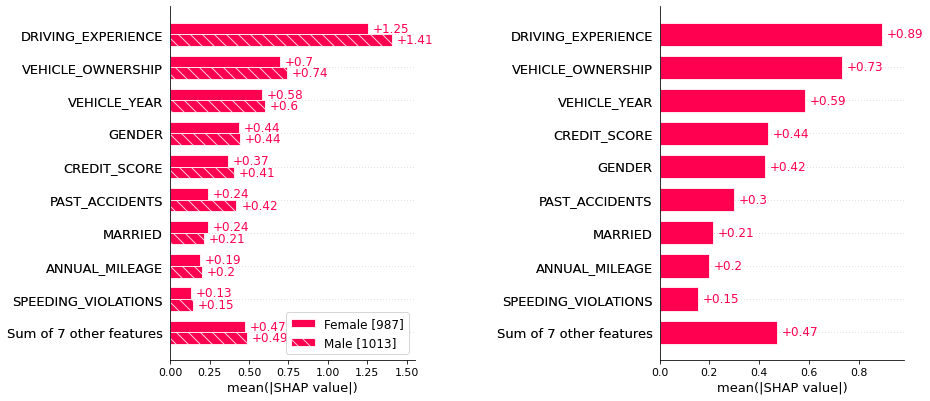

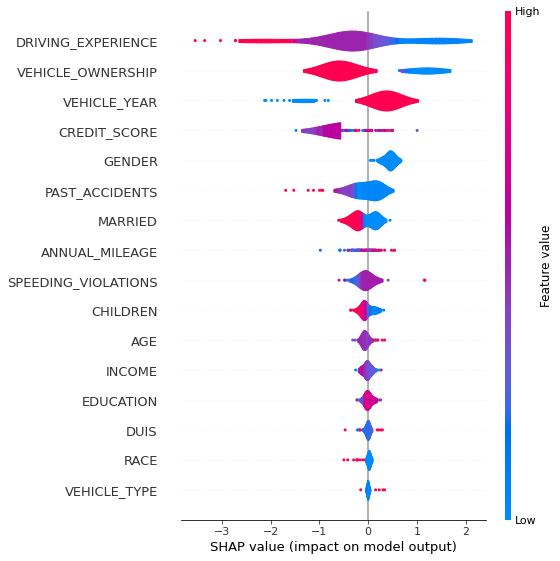

Affected Attribute Comparison
Average Comparison to True Class Members


Average Comparison to All Members


Random Affected Decision Process


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


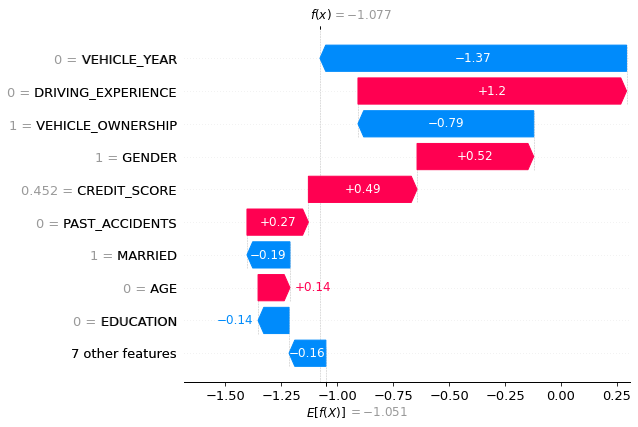

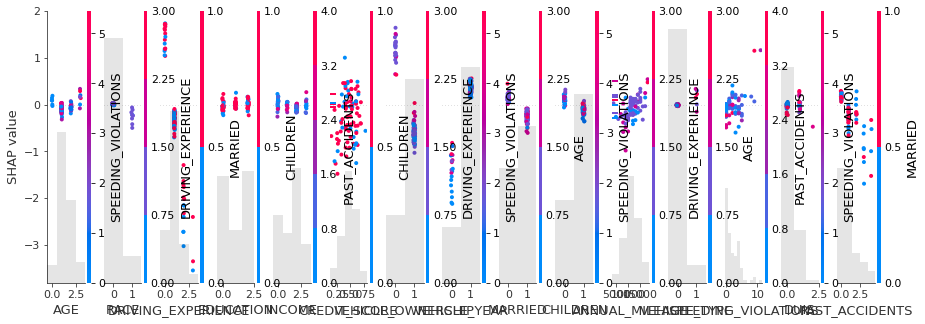

In [25]:
sensitive = 'GENDER' # sensible variable one wants to test for biases
labels = {0:'Female',1:'Male'} # 0 - Female and 1 - Male
fd.understand_shap(labels,'GENDER',1,0)

<font color=blue>__Bar Plots__</font><br>

Observing the graph on the right, we can see the overall feature importance, and on the left, we see the importance of the female and male based on the different features. In general, it seems as though the same factors are considered at roughly the same weight between genders. <br>

However, we do notice a gap within driving experience seeing that it is of higher importance to the model with males. Comparing the graph to the isolated FN cases, we immediately notice a big difference in importance between the car insurance claim observed in the overall outputs as opposed to the subgroup. It could be an indication that a certain sub characteristic of the male FN group is contributing to the incorrect labels.

Observing the pink graph on the right, we can see the overall feature importance, where the deal breaker is the income made in the year.



<font color=blue>__SHAP summary plot__</font><br>

Instead of looking at each individual instance, we can visualize the overall impact of these features across multiple instances using __SHAP summary plot__.The SHAP summary plot tells us the most important features and their range of effects over the dataset.From the plot above, we can gain some interesting insights into the model’s predictions:<br>
* The higher the driving experience the more less the person will be classified as 1 <br>
* Vehicle ownership also decreased the likely of car target 1 <br>
* Vehicle Year increases the liklyhood of target 1<br> 
* Gender Male decreaes the car insurance claim <br>
* ALl others are more around zero, less impact  <br>

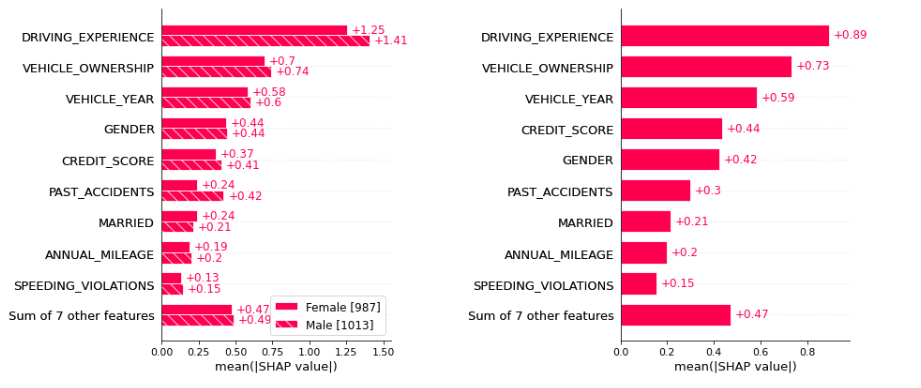
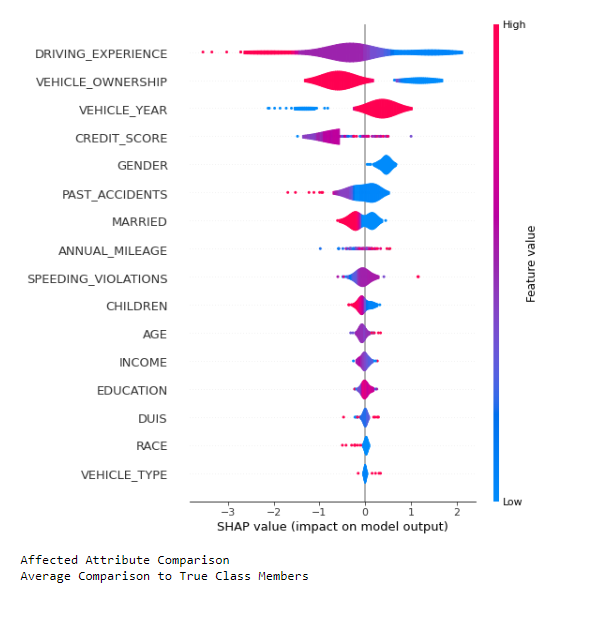

Graph 1 <br>
<font color=blue>__SHARP Waterfall__</font><br>
The blue bar shows how much a particular feature decreases the value of the prediction.
The red bar shows how much a particular feature increases the value of the prediction.Negative values imply probabilities of less than 0.5 that this value has no influence.<br>

<br>
* Vehicle Year: The Sharp value for this observation is given by the length, the absolute value shows how much income affects the prediction, so income contributes the most, Vehicle ownership second,Gender, driving experience, credit svore own housing, id a bit, own car. The sum of all SHARP values will equal to the E[f(x)] — f(x) ( where E[f(x)] is the expected value of the target variable and f(x) is the predicted value of the model)  <br>

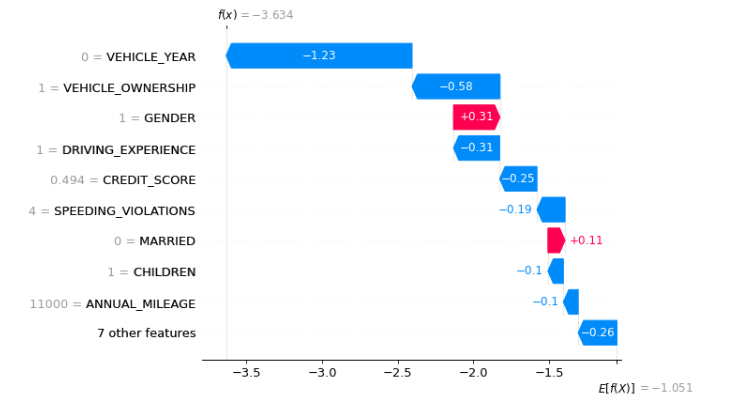

# Documentation of methods (docstrings)

In [26]:
print (fairdetect_classes.Report.__doc__)

 
        NAME: Report

        DESCRIPTION: A report module based on Seaborn
        Report takes the imported data set and returns a distribution of each of the 
        variables without having to call seaborn.pairplot.

        PARAMETERS: data (pandas dataframe) and dependent variable 

        RETURNS: Pairplots, violin and heatmap graphs made in seaborn

    


In [27]:
print (fairdetect_classes.Backup.__doc__)

 
        NAME: Backup

        DESCRIPTION: A duplication method to backup the original dataset

        PARAMETERS: data (pandas dataframe)

        RETURNS: A new dataframe with backed up data

    


In [28]:
print (fairdetect_classes.EnhancedLabelEncoder.__doc__)

 
        NAME: LabelEncoder

        DESCRIPTION: Takes columns in original dataset and prompts user for a label in each of them

        PARAMETERS: data (pandas dataframe)

        RETURNS: Same dataframe with recoded names for columns

    


In [29]:
print (fairdetect_classes.Splitting.__doc__)

 
        NAME: Splitting

        DESCRIPTION: Splits original dataset in X and y by removing all independent variables. X are the independent variables for a model, with the dependent already taken out
        y is the dependent variable already isolated

        PARAMETERS: data (pandas dataframe), dependent (dependent variables)

        RETURNS: X_train, X_test, y_train, y_test (with an 80-20% ratio for train and test respectively)

    


In [30]:
print (fairdetect_classes.FairDetect.__doc__)

 
        NAME: FairDetect

        DESCRIPTION: A method framework to detect bias in classification datasets

        PARAMETERS: Check individual method

        RETURNS: Check individual method
    


In [31]:
print (fairdetect_classes.FairDetect.__init__.__doc__)

Instatiation of model, X_test and y_test


In [32]:
print (fairdetect_classes.FairDetect.representation.__doc__)


        METHOD: representation

        DESCRIPTION: Performs a chi-test and a xg-boost prediction to
        understand the relation between the original ratio, and the 
        predictions of the classifier. Based on this, the chi test is done
        between the attribute chosen (sensitive variable), and the target
        variable. It will automatically accept or reject the null hypothesis

        PARAMETERS: The sensitive group, labels previously defined, and predictions

        RETURNS: Accept or reject the null hypothesis between sensitive and target
        


In [33]:
print (fairdetect_classes.FairDetect.ability.__doc__)


        METHOD: ability

        DESCRIPTION: A method to obtain the TPR (True Positive Rate), TNR (True 
        negative Rate), FPR (False Positive Rate), FNR (True Negative Rate)
        and store it as a variable

        PARAMETERS: sens_df returned in the representation method and the labels

        RETURNS: TPR, FNR, FPR, TNR
        


In [34]:
print (fairdetect_classes.FairDetect.ability_plots.__doc__)


        METHOD: ability_plots

        DESCRIPTION: Method to plot bars with each of the rates for positives
        and negatives as previously obtained in ability

        PARAMETERS: labels,TPR(True Positive Rate),FPR(True Positive Rate),
        TNR(True Negative Rate) ,FNR(False Negative Rate)

        RETURNS: A bar plot of the ability disparties of each TPR, FPR,TNR,FNR 
        based on the senstive variable
        


In [35]:
print (fairdetect_classes.FairDetect.ability_metrics.__doc__)


        METHOD: ability_metrics

        DESCRIPTION: Method to test the null hypothesis between TPR, FPR, TNR and FNR
        respectively with a given p value

        PARAMETERS: TPR(True Positive Rate),FPR(True Positive Rate),
        TNR(True Negative Rate) ,FNR(False Negative Rate)

        RETURNS: A message accepting or rejecting the null hypothesis, with the 
        respective p-values 
        


In [36]:
print (fairdetect_classes.FairDetect.predictive.__doc__)


        METHOD: Predictive Parity 

        DESCRIPTION: This model shows the predictive Paritybased on the sensitive 
        group.

        PARAMETERS: sens_df, labels

        RETURNS: Predictive disparity based on the senstive variables and test the 
        Hypothesis H0: No Significant Predictive Disparity.
        precision_dic,fig,pred_p
        


In [37]:
print (fairdetect_classes.FairDetect.identify_bias.__doc__)


        METHOD: identify_bias

        DESCRIPTION: Identifies the bias by comparing the average of all attributes
        to one group vs to all groups in a graphical manner

        PARAMETERS: The sensitive group and the labels

        RETURNS: The representative Model, the ability plots and ability metrics and 
        predictive diparity
        


In [38]:
print (fairdetect_classes.FairDetect.understand_shap.__doc__)


        METHOD: understand_shap

        DESCRIPTION: Identifies the bias by comparing the average of all attributes
        to one group vs to all groups in a graphical manner. The group is the
        previously identified as the affected one

        PARAMETERS: The sensitive group, labels, affected group and affected target

        RETURNS: A graph with mean sharp values, violin graph, bar graphs with the 
        average comparisom to true class members, average comparison to all members, 
        sharp waterfall and dependency scatter plot
        


<img src="group_a.png" width=200 height=100 align="left">

## <font color=DarkRed>__Team A - MBD Part Time 2022 - 23__</font>